In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/datasets/eddiehoogewerf/mozilla-commonvoice/commonvoice-v24_en-AU/commonvoice-v24_en-AU.csv
/kaggle/input/datasets/eddiehoogewerf/mozilla-commonvoice/commonvoice-v24_en-AU/commonvoice-v24_en-AU-split.csv
/kaggle/input/datasets/eddiehoogewerf/mozilla-commonvoice/commonvoice-v24_en-AU/audio_files/common_voice_en_39598667.mp3
/kaggle/input/datasets/eddiehoogewerf/mozilla-commonvoice/commonvoice-v24_en-AU/audio_files/common_voice_en_181169.mp3
/kaggle/input/datasets/eddiehoogewerf/mozilla-commonvoice/commonvoice-v24_en-AU/audio_files/common_voice_en_24831513.mp3
/kaggle/input/datasets/eddiehoogewerf/mozilla-commonvoice/commonvoice-v24_en-AU/audio_files/common_voice_en_18173259.mp3
/kaggle/input/datasets/eddiehoogewerf/mozilla-commonvoice/commonvoice-v24_en-AU/audio_files/common_voice_en_19501589.mp3
/kaggle/input/datasets/eddiehoogewerf/mozilla-commonvoice/commonvoice-v24_en-AU/audio_files/common_voice_en_19515696.mp3
/kaggle/input/datasets/eddiehoogewerf/mozilla-commonvoice/

In [2]:
!pip -q install -U pandas numpy matplotlib librosa soundfile tqdm jiwer datasets evaluate

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 3.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.8/52.8 kB 3.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.7/57.7 kB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.9/10.9 MB 95.5 MB/s eta 0:00:00:00:010:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.7/8.7 MB 101.7 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.4/78.4 kB 7.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 515.2/515.2 kB 36.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.1/84.1 kB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 98.3 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
bigframes 2.26.0 requires google-cloud-bigquery-storage<3.0.0,>=2.30.0, which is not installed

In [4]:
import os, re, glob, math, random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tqdm.auto import tqdm
import soundfile as sf
import librosa
import librosa.display

# ====== Set these roots to your Kaggle input dataset paths ======
CV_ROOT   = "/kaggle/input/datasets/eddiehoogewerf/mozilla-commonvoice/commonvoice-v24_en-AU"   # change if needed
LS_ROOT   = "/kaggle/input/datasets/pypiahmad/librispeech-asr-corpus"                      # change if needed

CV_AUDIO_DIR = os.path.join(CV_ROOT, "audio_files")
CV_CSV_MAIN  = os.path.join(CV_ROOT, "commonvoice-v24_en-AU.csv")
CV_CSV_SPLIT = os.path.join(CV_ROOT, "commonvoice-v24_en-AU-split.csv")

print("CV_AUDIO_DIR:", CV_AUDIO_DIR)
print("CV_CSV_MAIN :", CV_CSV_MAIN)
print("CV_CSV_SPLIT:", CV_CSV_SPLIT)
print("LS_ROOT     :", LS_ROOT)

assert os.path.isdir(CV_AUDIO_DIR)
assert os.path.isfile(CV_CSV_MAIN)
assert os.path.isfile(CV_CSV_SPLIT)
assert os.path.isdir(LS_ROOT)

CV_AUDIO_DIR: /kaggle/input/datasets/eddiehoogewerf/mozilla-commonvoice/commonvoice-v24_en-AU/audio_files
CV_CSV_MAIN : /kaggle/input/datasets/eddiehoogewerf/mozilla-commonvoice/commonvoice-v24_en-AU/commonvoice-v24_en-AU.csv
CV_CSV_SPLIT: /kaggle/input/datasets/eddiehoogewerf/mozilla-commonvoice/commonvoice-v24_en-AU/commonvoice-v24_en-AU-split.csv
LS_ROOT     : /kaggle/input/datasets/pypiahmad/librispeech-asr-corpus


In [5]:
df_main  = pd.read_csv(CV_CSV_MAIN)
df_split = pd.read_csv(CV_CSV_SPLIT)

# Merge on 'path' (your case)
df_cv = df_main.merge(df_split, on="path", how="inner", suffixes=("_x", "_y"))

# Choose transcript column (prefer sentence_x)
text_col = "sentence_x" if "sentence_x" in df_cv.columns else ("sentence_y" if "sentence_y" in df_cv.columns else None)
assert text_col is not None, "No sentence column found."

df_cv["audio_path"] = df_cv["path"].astype(str).apply(lambda x: os.path.join(CV_AUDIO_DIR, x))
df_cv = df_cv[df_cv["audio_path"].apply(os.path.isfile)].copy()

# Keep canonical columns
keep_cols = [c for c in [
    "audio_path","path", text_col,
    "client_id_x","gender_x","age_x","accents_x","variant_x","locale_x","duration_ms_x",
    "up_votes_x","down_votes_x","sentence_domain_x"
] if c in df_cv.columns]

df_cv = df_cv[keep_cols].rename(columns={text_col:"text"})
df_cv["text"] = df_cv["text"].astype(str)

print(df_cv.shape)
df_cv.head()

(55673, 13)


,audio_path,path,text,client_id_x,gender_x,age_x,accents_x,variant_x,locale_x,duration_ms_x,up_votes_x,down_votes_x,sentence_domain_x
0,/kaggle/input/datasets/eddiehoogewerf/mozilla-...,common_voice_en_30513358.mp3,Princess Vilas herself also contributed person...,0621ad6390e651ff1e39b23f74e8d624bd8ba0957d6a19...,male_masculine,teens,Australian English,NaN,en,7.387500,4,0,NaN
1,/kaggle/input/datasets/eddiehoogewerf/mozilla-...,common_voice_en_43618790.mp3,He has also served in the Chamber of Deputies.,18bea6bb076cd9638518d93b4af353c3c329d059789e11...,NaN,NaN,Australian English,NaN,en,6.307500,2,0,NaN
2,/kaggle/input/datasets/eddiehoogewerf/mozilla-...,common_voice_en_21099981.mp3,Most of his subjects were found in Devon and C...,1db7f61c407a3cdce51e21ae1871ef9ae3ed74d79415ba...,male_masculine,thirties,Australian English,NaN,en,7.949625,2,0,NaN
3,/kaggle/input/datasets/eddiehoogewerf/mozilla-...,common_voice_en_39588772.mp3,Shots rang out as they fled towards the Austri...,2144a6feb6a906b220cbba00f37b56084bd2d60cce773e...,NaN,NaN,Australian English,NaN,en,5.515500,2,0,NaN
4,/kaggle/input/datasets/eddiehoogewerf/mozilla-...,common_voice_en_37211578.mp3,The system is based on electromagnetic induction.,22b4048e01f359c779cf9a692f5da7512bfd7ef8c9fff2...,NaN,NaN,Australian English,NaN,en,4.055656,2,0,NaN


In [6]:
print("Rows:", len(df_cv))
if "client_id_x" in df_cv.columns:
    print("Unique speakers:", df_cv["client_id_x"].nunique())

print("\nMissing values (%):")
display((df_cv.isna().mean()*100).sort_values(ascending=False).head(12))

Rows: 55673
Unique speakers: 842

Missing values (%):


variant_x            100.000000
sentence_domain_x     99.996408
gender_x              26.788569
age_x                  5.009610
audio_path             0.000000
client_id_x            0.000000
text                   0.000000
path                   0.000000
accents_x              0.000000
locale_x               0.000000
duration_ms_x          0.000000
up_votes_x             0.000000
dtype: float64

In [7]:
def basic_text_clean(s):
    s = str(s).lower().strip()
    s = re.sub(r"\s+", " ", s)
    return s

df_cv["text_clean"] = df_cv["text"].apply(basic_text_clean)
df_cv["n_chars"] = df_cv["text_clean"].str.len()
df_cv["n_words"] = df_cv["text_clean"].str.split().apply(len)

# Duration (if exists in ms)
if "duration_ms_x" in df_cv.columns:
    df_cv["duration_sec_meta"] = df_cv["duration_ms_x"].astype(float) / 1000.0

display(df_cv[["n_chars","n_words"] + (["duration_sec_meta"] if "duration_sec_meta" in df_cv.columns else [])].describe())

,n_chars,n_words,duration_sec_meta
count,55673.000000,55673.000000,55673.000000
mean,56.742945,9.602698,0.005039
std,36.694897,3.758004,0.001665
min,2.000000,1.000000,0.000868
25%,40.000000,7.000000,0.003820
50%,57.000000,10.000000,0.004939
75%,73.000000,12.000000,0.006150
max,6607.000000,425.000000,0.022492


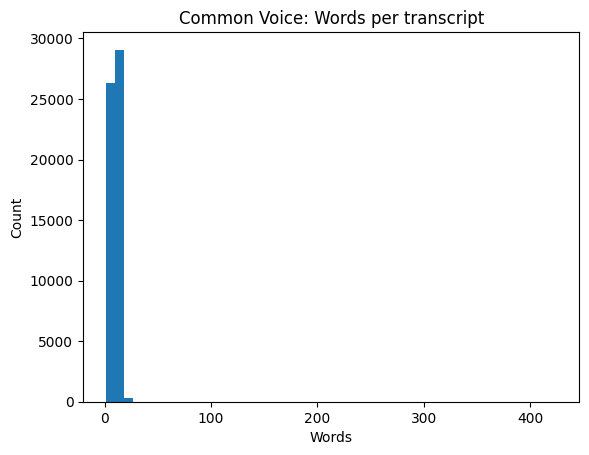

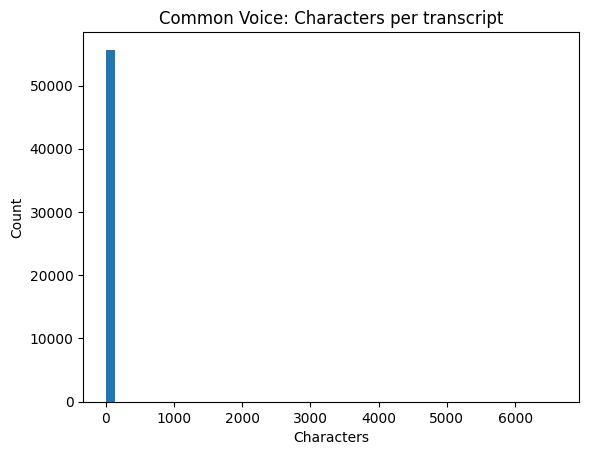

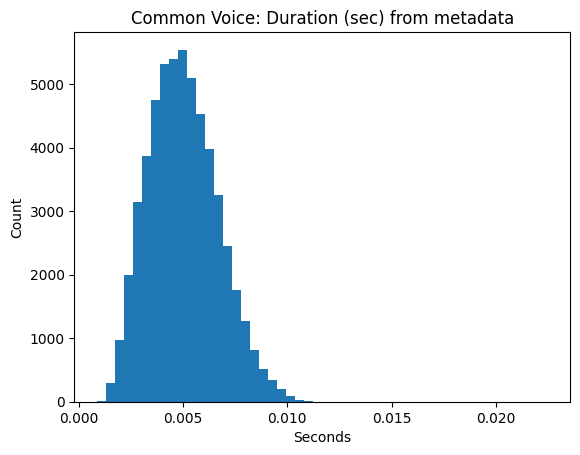

In [8]:
plt.figure()
plt.hist(df_cv["n_words"], bins=50)
plt.title("Common Voice: Words per transcript")
plt.xlabel("Words")
plt.ylabel("Count")
plt.show()

plt.figure()
plt.hist(df_cv["n_chars"], bins=50)
plt.title("Common Voice: Characters per transcript")
plt.xlabel("Characters")
plt.ylabel("Count")
plt.show()

if "duration_sec_meta" in df_cv.columns:
    plt.figure()
    plt.hist(df_cv["duration_sec_meta"].dropna(), bins=50)
    plt.title("Common Voice: Duration (sec) from metadata")
    plt.xlabel("Seconds")
    plt.ylabel("Count")
    plt.show()

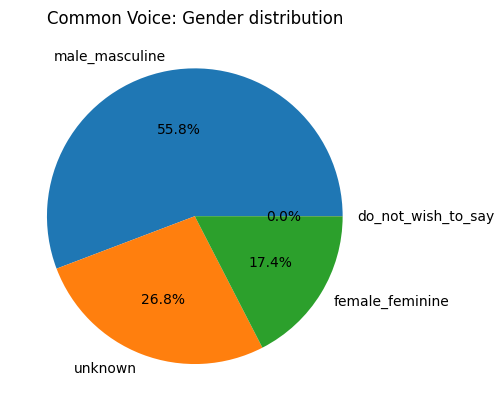

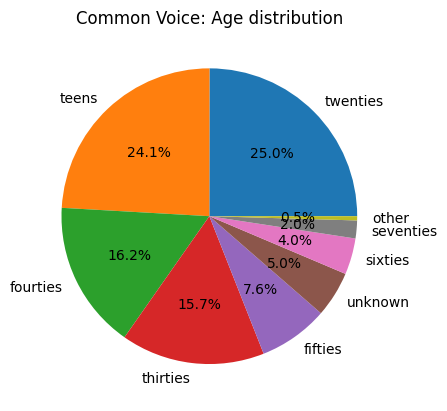

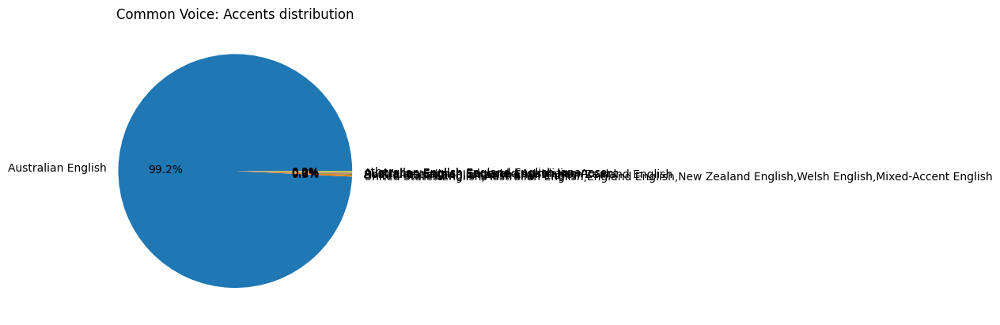

In [15]:
def pie_of_col(df, col, topn=8, title=None):
    if col not in df.columns: 
        print(f"Column {col} not present.")
        return
    s = df[col].fillna("unknown").astype(str).str.strip()
    vc = s.value_counts()
    if len(vc) > topn:
        vc2 = pd.concat([vc.head(topn), pd.Series({"other": vc.iloc[topn:].sum()})])
    else:
        vc2 = vc
    plt.figure()
    plt.pie(vc2.values, labels=vc2.index, autopct="%1.1f%%")
    plt.title(title or f"Distribution: {col}")
    plt.show()

pie_of_col(df_cv, "gender_x", title="Common Voice: Gender distribution")
pie_of_col(df_cv, "age_x", title="Common Voice: Age distribution")
pie_of_col(df_cv, "accents_x", title="Common Voice: Accents distribution")

  0%|          | 0/2000 [00:00<?, ?it/s]

count    2000.000000
mean        5.030418
std         1.653349
min         1.180125
25%         3.845625
50%         4.876875
75%         6.153094
max        10.828125
Name: duration_sec_real, dtype: float64


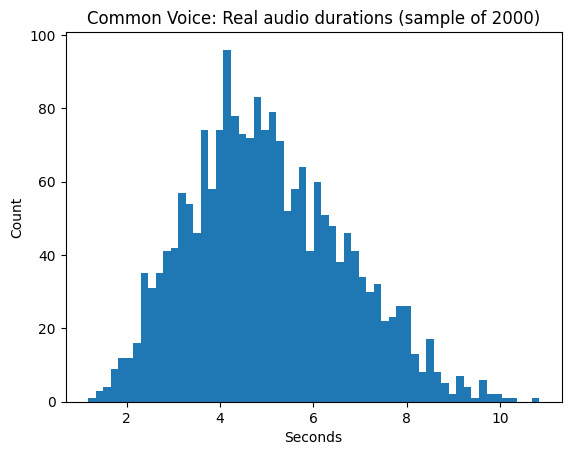

In [16]:
def get_audio_duration_sec(path):
    try:
        info = sf.info(path)
        return float(info.frames) / float(info.samplerate)
    except Exception:
        # fallback if sf can't read (e.g. mp3)
        y, sr = librosa.load(path, sr=None)
        return len(y) / sr

SAMPLE_N = min(2000, len(df_cv))
sample_paths = df_cv["audio_path"].sample(SAMPLE_N, random_state=42).tolist()

durations = []
for p in tqdm(sample_paths):
    durations.append(get_audio_duration_sec(p))

df_cv_sample_dur = pd.Series(durations, name="duration_sec_real")
print(df_cv_sample_dur.describe())

plt.figure()
plt.hist(df_cv_sample_dur, bins=60)
plt.title(f"Common Voice: Real audio durations (sample of {SAMPLE_N})")
plt.xlabel("Seconds")
plt.ylabel("Count")
plt.show()

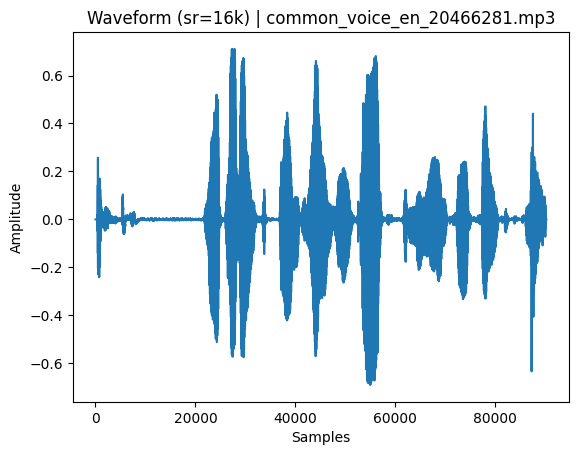

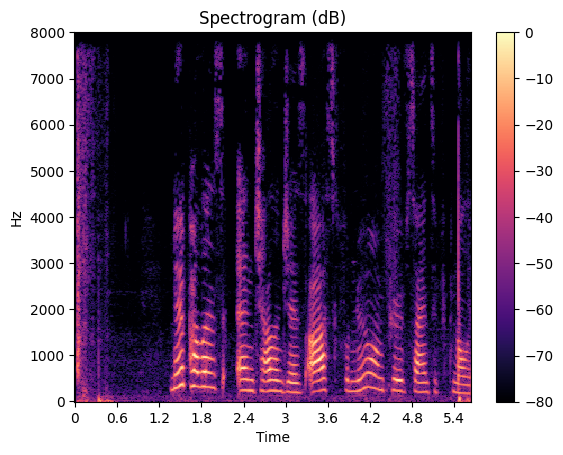

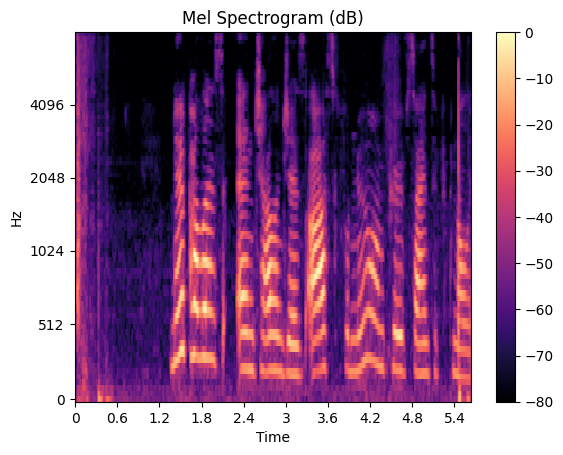

Transcript: New problems and challenges ask for new or improved scientific knowledge.


In [17]:
ex = df_cv.sample(1, random_state=7).iloc[0]
audio_path = ex["audio_path"]
y, sr = librosa.load(audio_path, sr=16000)

plt.figure()
plt.plot(y)
plt.title(f"Waveform (sr=16k) | {os.path.basename(audio_path)}")
plt.xlabel("Samples")
plt.ylabel("Amplitude")
plt.show()

# Spectrogram
S = np.abs(librosa.stft(y, n_fft=1024, hop_length=256))
S_db = librosa.amplitude_to_db(S, ref=np.max)
plt.figure()
librosa.display.specshow(S_db, sr=sr, hop_length=256, x_axis="time", y_axis="hz")
plt.title("Spectrogram (dB)")
plt.colorbar()
plt.show()

# Mel spectrogram
M = librosa.feature.melspectrogram(y=y, sr=sr, n_fft=1024, hop_length=256, n_mels=80)
M_db = librosa.power_to_db(M, ref=np.max)
plt.figure()
librosa.display.specshow(M_db, sr=sr, hop_length=256, x_axis="time", y_axis="mel")
plt.title("Mel Spectrogram (dB)")
plt.colorbar()
plt.show()

print("Transcript:", ex["text"])

In [18]:
def parse_librispeech_split(split_dir, split_name):
    """
    split_dir like: /kaggle/input/LibriSpeech ASR corpus/train-clean-360
    Returns dataframe with: audio_path, text, speaker_id, chapter_id, utt_id, split
    """
    rows = []
    trans_files = glob.glob(os.path.join(split_dir, "**", "*.trans.txt"), recursive=True)
    for tf in tqdm(trans_files, desc=f"Parsing {split_name}"):
        # file path contains speaker/chapter
        # .../speaker/chapter/speaker-chapter.trans.txt
        base_dir = os.path.dirname(tf)
        with open(tf, "r", encoding="utf-8") as f:
            for line in f:
                line = line.strip()
                if not line:
                    continue
                utt_id, text = line.split(" ", 1)
                # audio file typically .flac
                audio_path = os.path.join(base_dir, utt_id + ".flac")
                if not os.path.isfile(audio_path):
                    # some variants can be .wav (rare)
                    alt = glob.glob(os.path.join(base_dir, utt_id + ".*"))
                    audio_path = alt[0] if alt else audio_path

                spk, chap = utt_id.split("-")[0], utt_id.split("-")[1]
                rows.append({
                    "audio_path": audio_path,
                    "text": text,
                    "speaker_id": spk,
                    "chapter_id": chap,
                    "utt_id": utt_id,
                    "split": split_name
                })
    df = pd.DataFrame(rows)
    df = df[df["audio_path"].apply(os.path.isfile)].reset_index(drop=True)
    return df

LS_SPLITS = {
    "train-clean-360": os.path.join(LS_ROOT, "train-clean-360"),
    "dev-clean": os.path.join(LS_ROOT, "dev-clean"),
    "test-clean": os.path.join(LS_ROOT, "test-clean"),
}

df_ls_parts = []
for name, path in LS_SPLITS.items():
    assert os.path.isdir(path), f"Missing split folder: {path}"
    df_ls_parts.append(parse_librispeech_split(path, name))

df_ls = pd.concat(df_ls_parts, ignore_index=True)
print(df_ls.shape)
df_ls.head()

Parsing train-clean-360:   0%|          | 0/2097 [00:00<?, ?it/s]

Parsing dev-clean:   0%|          | 0/97 [00:00<?, ?it/s]

Parsing test-clean:   0%|          | 0/87 [00:00<?, ?it/s]

(109337, 6)


,audio_path,text,speaker_id,chapter_id,utt_id,split
0,/kaggle/input/datasets/pypiahmad/librispeech-a...,THE BROTHERS CHEERYBLE MAKE VARIOUS DECLARATIO...,3347,134425,3347-134425-0000,train-clean-360
1,/kaggle/input/datasets/pypiahmad/librispeech-a...,MADELINE HAD BEEN REMOVED FRANK HAD BEEN ABSEN...,3347,134425,3347-134425-0001,train-clean-360
2,/kaggle/input/datasets/pypiahmad/librispeech-a...,WHEN THERE CAME ONE EVENING PER FAVOUR OF MIST...,3347,134425,3347-134425-0002,train-clean-360
3,/kaggle/input/datasets/pypiahmad/librispeech-a...,NOW MY DEARS SAID MISSUS NICKLEBY WHEN THEY HA...,3347,134425,3347-134425-0003,train-clean-360
4,/kaggle/input/datasets/pypiahmad/librispeech-a...,I SAY MY DEAR REJOINED THAT LADY WITH A FACE O...,3347,134425,3347-134425-0004,train-clean-360


In [20]:
df_ls["text_clean"] = df_ls["text"].apply(basic_text_clean)
df_ls["n_chars"] = df_ls["text_clean"].str.len()
df_ls["n_words"] = df_ls["text_clean"].str.split().apply(len)

print("Total utterances:", len(df_ls))
print("Unique speakers:", df_ls["speaker_id"].nunique())

# display(df_ls.groupby("split")[["n_words","n_chars"]].describe())
df_ls.groupby("split")[["n_words","n_chars"]].agg(["mean","std","min","max"])

Total utterances: 109337
Unique speakers: 1001


n_words                        n_chars                    
                      mean        std min max        mean        std min  max
split                                                                        
dev-clean        20.126526  13.524448   1  92  106.716981  73.947954   3  516
test-clean       20.067176  13.725868   1  96  107.454198  76.710883   5  576
train-clean-360  34.567404  11.549011   1  83  183.833590  60.143592   3  524

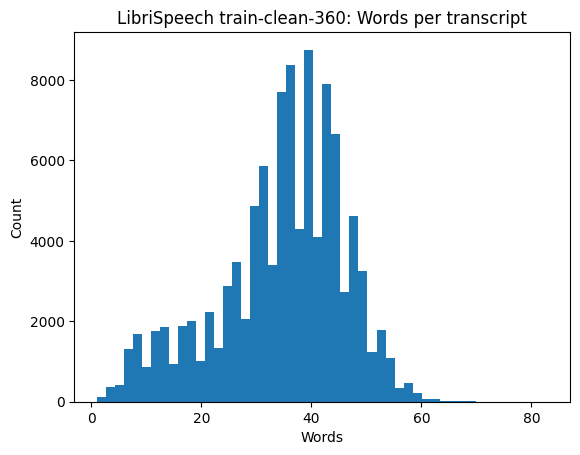

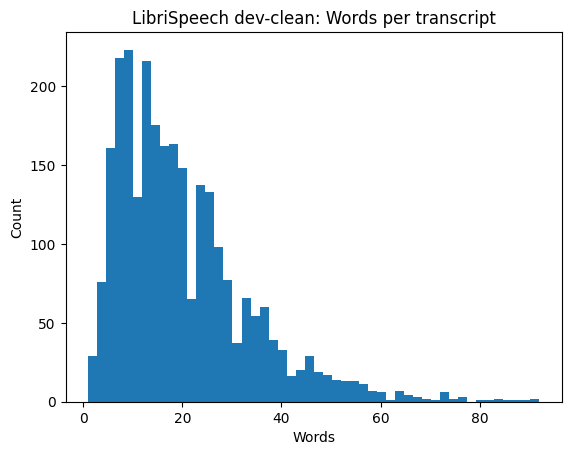

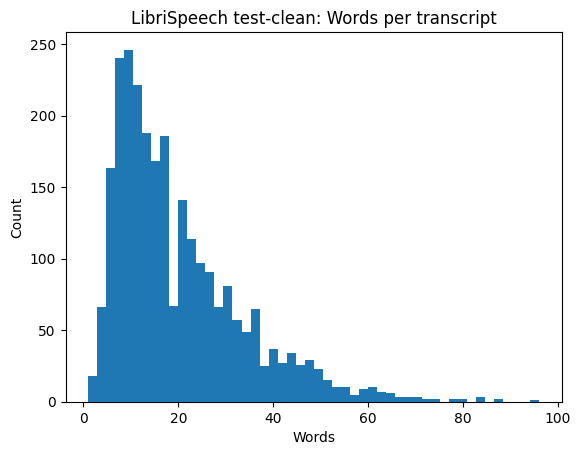

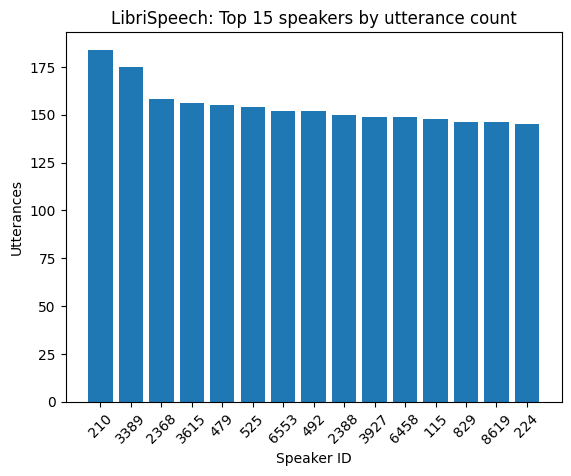

In [21]:
for split in df_ls["split"].unique():
    sub = df_ls[df_ls["split"] == split]
    plt.figure()
    plt.hist(sub["n_words"], bins=50)
    plt.title(f"LibriSpeech {split}: Words per transcript")
    plt.xlabel("Words")
    plt.ylabel("Count")
    plt.show()

top_spk = df_ls["speaker_id"].value_counts().head(15)
plt.figure()
plt.bar(top_spk.index.astype(str), top_spk.values)
plt.title("LibriSpeech: Top 15 speakers by utterance count")
plt.xlabel("Speaker ID")
plt.ylabel("Utterances")
plt.xticks(rotation=45)
plt.show()

Durations (sample):   0%|          | 0/2000 [00:00<?, ?it/s]

count    2000.000000
mean       12.286505
std         3.905775
min         1.835000
25%        10.452500
50%        13.827500
75%        15.100000
max        28.570000
Name: duration_sec_real, dtype: float64


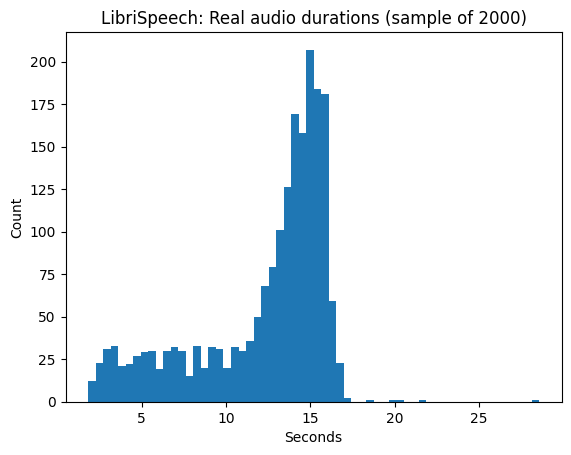

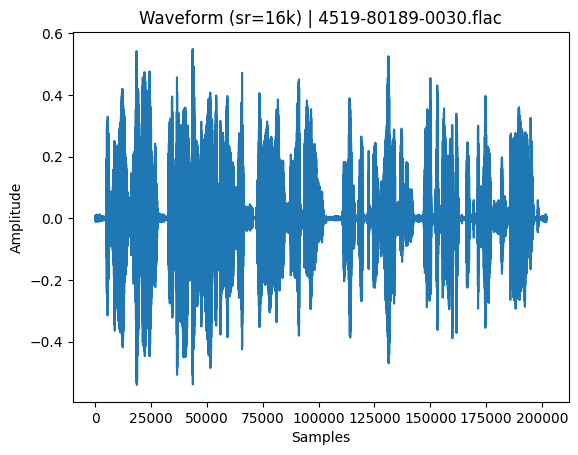

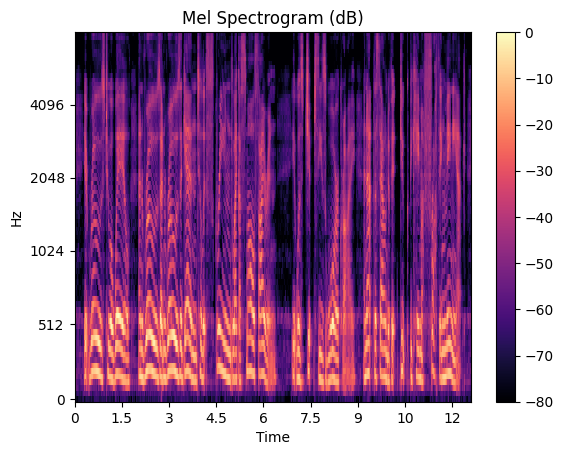

Transcript: IT ROSE TO A WAIL AND ROSE AND ROSE AGAIN TILL IT SCREAMED LIKE A SMALL SIREN IT WAS GIPSY'S WAR CRY AND AT THE SOUND OF IT DUKE BECAME A FROTHING MANIAC
Split: train-clean-360 | Speaker: 4519


In [22]:
SAMPLE_N = 2000
sample_ls = df_ls.sample(min(SAMPLE_N, len(df_ls)), random_state=42)

dur = []
for p in tqdm(sample_ls["audio_path"].tolist(), desc="Durations (sample)"):
    try:
        info = sf.info(p)
        dur.append(info.frames / info.samplerate)
    except Exception:
        y, sr = librosa.load(p, sr=None)
        dur.append(len(y)/sr)

dur = pd.Series(dur, name="duration_sec_real")
print(dur.describe())

plt.figure()
plt.hist(dur, bins=60)
plt.title(f"LibriSpeech: Real audio durations (sample of {len(dur)})")
plt.xlabel("Seconds")
plt.ylabel("Count")
plt.show()

# single example viz
ex = df_ls.sample(1, random_state=7).iloc[0]
y, sr = librosa.load(ex["audio_path"], sr=16000)

plt.figure()
plt.plot(y)
plt.title(f"Waveform (sr=16k) | {os.path.basename(ex['audio_path'])}")
plt.xlabel("Samples")
plt.ylabel("Amplitude")
plt.show()

M = librosa.feature.melspectrogram(y=y, sr=sr, n_fft=1024, hop_length=256, n_mels=80)
M_db = librosa.power_to_db(M, ref=np.max)
plt.figure()
librosa.display.specshow(M_db, sr=sr, hop_length=256, x_axis="time", y_axis="mel")
plt.title("Mel Spectrogram (dB)")
plt.colorbar()
plt.show()

print("Transcript:", ex["text"])
print("Split:", ex["split"], "| Speaker:", ex["speaker_id"])

In [23]:
def normalize_asr_text(s: str) -> str:
    s = str(s).lower().strip()
    # Keep letters, digits, apostrophe; convert others to space
    s = re.sub(r"[^a-z0-9'\s]", " ", s)
    s = re.sub(r"\s+", " ", s).strip()
    return s

def add_common_text_features(df):
    df = df.copy()
    df["text_norm"] = df["text"].apply(normalize_asr_text)
    df["n_words"] = df["text_norm"].str.split().apply(len)
    df["n_chars"] = df["text_norm"].str.len()
    return df

In [24]:
def compute_duration_fast(path):
    # Fast duration via soundfile when possible
    try:
        info = sf.info(path)
        return info.frames / info.samplerate
    except Exception:
        y, sr = librosa.load(path, sr=None)
        return len(y)/sr

def preprocess_metadata(df, min_sec=1.0, max_sec=15.0, min_words=1):
    df = add_common_text_features(df)
    df = df[df["text_norm"].str.len() > 0].copy()
    df = df[df["n_words"] >= min_words].copy()

    # Compute duration on a sample or fully (here: fully; can be slow for huge sets)
    durs = []
    for p in tqdm(df["audio_path"].tolist(), desc="Computing durations"):
        durs.append(compute_duration_fast(p))
    df["duration_sec"] = durs

    df = df[(df["duration_sec"] >= min_sec) & (df["duration_sec"] <= max_sec)].copy()
    return df.reset_index(drop=True)

# Apply to CV (usually smaller)
df_cv_prep = preprocess_metadata(df_cv[["audio_path","text"]], min_sec=1.0, max_sec=15.0, min_words=1)
print("CV after preprocessing:", df_cv_prep.shape)

# Apply to LS (can be large; you can subsample first if needed)
# For speed, optionally preprocess only dev/test first:
df_ls_devtest = df_ls[df_ls["split"].isin(["dev-clean","test-clean"])][["audio_path","text","split","speaker_id","utt_id"]].copy()
df_ls_devtest_prep = preprocess_metadata(df_ls_devtest, min_sec=1.0, max_sec=15.0, min_words=1)
print("LS dev/test after preprocessing:", df_ls_devtest_prep.shape)

Computing durations:   0%|          | 0/55673 [00:00<?, ?it/s]

CV after preprocessing: (55667, 6)


Computing durations:   0%|          | 0/5323 [00:00<?, ?it/s]

LS dev/test after preprocessing: (4895, 9)


In [25]:
out_dir = "/kaggle/working/asr_metadata"
os.makedirs(out_dir, exist_ok=True)

df_cv_prep.to_csv(os.path.join(out_dir, "commonvoice_enAU_clean.csv"), index=False)
df_ls_devtest_prep.to_csv(os.path.join(out_dir, "librispeech_devtest_clean.csv"), index=False)

print("Saved to:", out_dir)

Saved to: /kaggle/working/asr_metadata


LibriSpeech (all parsed splits) | #Speakers: 1001 | Total utt: 109337 | Gini: 0.0966


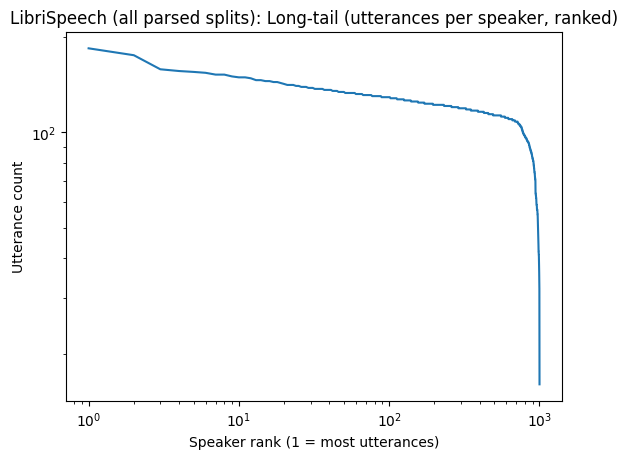

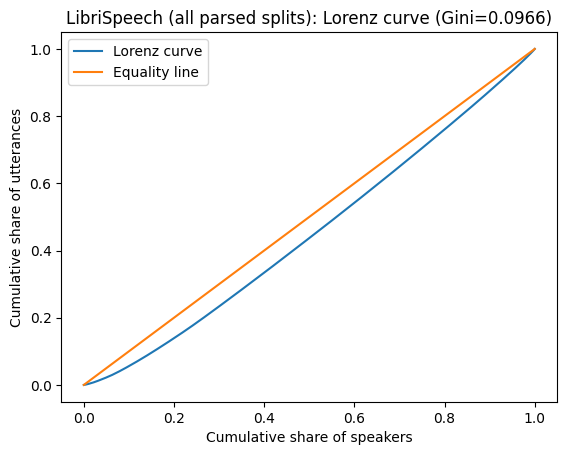

  Top-1 speakers contribute: 0.17% of utterances
  Top-5 speakers contribute: 0.76% of utterances
  Top-10 speakers contribute: 1.45% of utterances
  Top-50 speakers contribute: 6.54% of utterances
  Top-100 speakers contribute: 12.52% of utterances
Common Voice en-AU (merged) | #Speakers: 842 | Total utt: 55673 | Gini: 0.8108


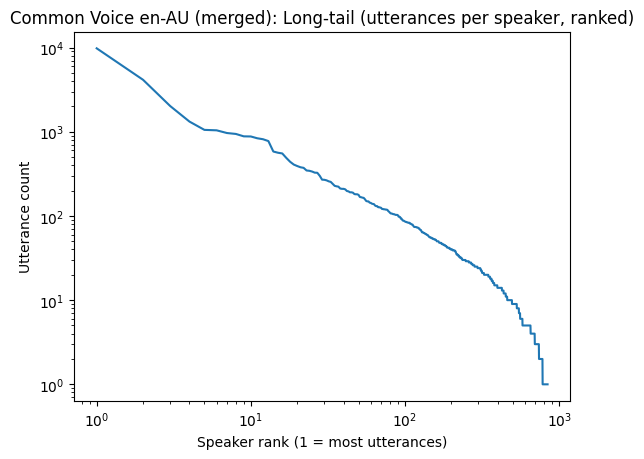

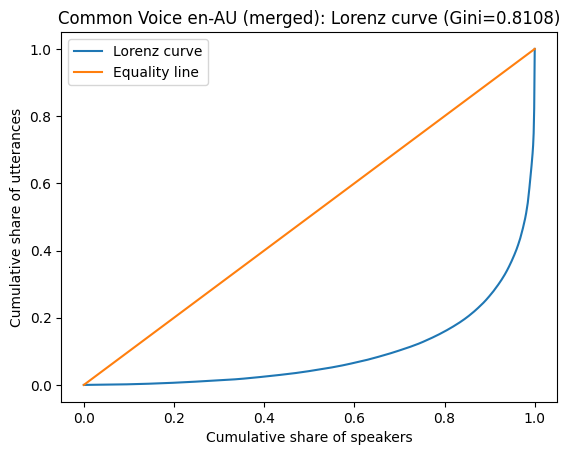

  Top-1 speakers contribute: 17.62% of utterances
  Top-5 speakers contribute: 32.97% of utterances
  Top-10 speakers contribute: 41.43% of utterances
  Top-50 speakers contribute: 65.41% of utterances
  Top-100 speakers contribute: 76.21% of utterances


In [26]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def gini_coefficient(x: np.ndarray) -> float:
    """
    Gini for non-negative values.
    0 = perfectly equal distribution, 1 = maximal inequality.
    """
    x = np.asarray(x, dtype=np.float64)
    x = x[x >= 0]
    if x.size == 0:
        return np.nan
    if np.all(x == 0):
        return 0.0
    x_sorted = np.sort(x)
    n = x_sorted.size
    cumx = np.cumsum(x_sorted)
    # Gini formula based on cumulative sums
    g = (n + 1 - 2 * np.sum(cumx) / cumx[-1]) / n
    return float(g)

def lorenz_curve(x: np.ndarray):
    x = np.asarray(x, dtype=np.float64)
    x = x[x >= 0]
    x_sorted = np.sort(x)
    cumx = np.cumsum(x_sorted)
    cumx = np.insert(cumx, 0, 0)
    cumx = cumx / cumx[-1] if cumx[-1] > 0 else cumx
    population = np.linspace(0, 1, cumx.size)
    return population, cumx

def speaker_imbalance_report(df, speaker_col: str, title_prefix: str):
    if speaker_col not in df.columns:
        print(f"[{title_prefix}] Speaker column '{speaker_col}' not found. Skipping.")
        return

    spk_counts = df[speaker_col].fillna("unknown").astype(str).value_counts()
    counts = spk_counts.values

    g = gini_coefficient(counts)
    print(f"{title_prefix} | #Speakers: {len(spk_counts)} | Total utt: {counts.sum()} | Gini: {g:.4f}")

    # Long-tail: utterances per speaker (rank plot)
    ranks = np.arange(1, len(spk_counts) + 1)

    plt.figure()
    plt.plot(ranks, counts)
    plt.title(f"{title_prefix}: Long-tail (utterances per speaker, ranked)")
    plt.xlabel("Speaker rank (1 = most utterances)")
    plt.ylabel("Utterance count")
    plt.yscale("log")
    plt.xscale("log")
    plt.show()

    # Lorenz curve
    pop, lor = lorenz_curve(counts)
    plt.figure()
    plt.plot(pop, lor, label="Lorenz curve")
    plt.plot([0, 1], [0, 1], label="Equality line")
    plt.title(f"{title_prefix}: Lorenz curve (Gini={g:.4f})")
    plt.xlabel("Cumulative share of speakers")
    plt.ylabel("Cumulative share of utterances")
    plt.legend()
    plt.show()

    # Contribution of top-k speakers
    for k in [1, 5, 10, 50, 100]:
        if len(spk_counts) >= k:
            share = spk_counts.head(k).sum() / spk_counts.sum()
            print(f"  Top-{k} speakers contribute: {share*100:.2f}% of utterances")

# LibriSpeech: use df_ls (raw) or df_ls_devtest_prep if you want filtered only
speaker_imbalance_report(df_ls, "speaker_id", "LibriSpeech (all parsed splits)")

# Common Voice: if you still have speaker id (client_id_x) available in your CV df
if "client_id_x" in df_cv.columns:
    speaker_imbalance_report(df_cv, "client_id_x", "Common Voice en-AU (merged)")
else:
    print("Common Voice speaker imbalance skipped (no client_id_x column in df_cv).")

Common Voice vocab size: 43692
LibriSpeech vocab size: 10566
CV OOV wrt LibriSpeech vocab: 0.1897  (OOV tokens 102195/538695)
LibriSpeech OOV wrt CV vocab: 0.0468  (OOV tokens 3983/85033)
Unique-word OOV (types): CV not in LS = 0.8209, LS not in CV = 0.2592


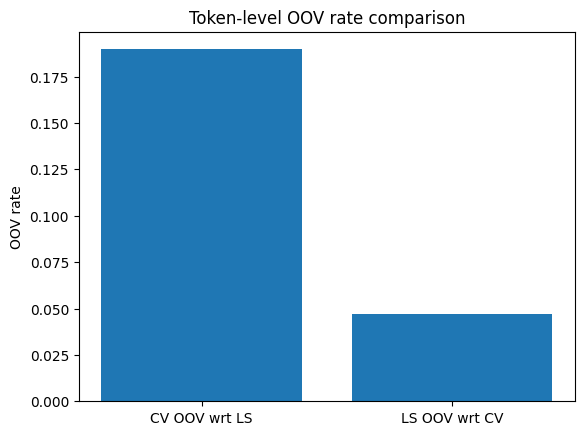


Top CV words not in LibriSpeech vocab:


area             442
include          271
album            247
film             244
team             222
currently        216
based            209
released         182
international    145
alchemist        137
football         132
includes         131
site             130
township         127
areas            125
northern         125
research         120
council          116
california       113
league           111
role             109
systems          108
featured         104
recorded         103
director          96
special           93
william           92
referred          92
video             92
mostly            91
dtype: int64


Top LibriSpeech words not in CV vocab:


missus          45
thee            37
bozzle          14
randal          14
hath            12
boolooroo       12
ursus           12
uncas           10
phoebe          10
gwynplaine      10
montfichet       9
meekin           9
delightful       9
squire           8
poyser           8
apostle          7
fitzooth         7
kirkland         7
servadac         7
ojo              7
tis              7
timaeus          7
indifference     7
beggar           7
macklewain       7
mainhall         7
gamewell         7
pinkies          6
minnetaki        6
pecuniary        6
dtype: int64

In [28]:
import re
import numpy as np
import matplotlib.pyplot as plt

def build_vocab_from_texts(texts, min_freq=1):
    """
    Builds a word vocabulary set from an iterable of normalized texts.
    Returns: vocab_set, freq_counter (pd.Series) OOV=Out Of Vocabulary
    """
    counter = {}
    for s in texts:
        s = str(s)
        # tokenization: space-split is fine since you already normalized
        for w in s.split():
            counter[w] = counter.get(w, 0) + 1
    freq = pd.Series(counter).sort_values(ascending=False)
    vocab = set(freq[freq >= min_freq].index)
    return vocab, freq

def oov_stats(source_texts, ref_vocab: set):
    """
    OOV computed on tokens from source_texts against ref_vocab.
    Returns: oov_rate, total_tokens, oov_tokens_count
    """
    total = 0
    oov = 0
    for s in source_texts:
        toks = str(s).split()
        total += len(toks)
        oov += sum(1 for t in toks if t not in ref_vocab)
    rate = (oov / total) if total > 0 else np.nan
    return float(rate), int(total), int(oov)

# Use normalized text if available; otherwise fall back to basic normalization
# Common Voice prepared csv has text_norm
cv_texts = df_cv_prep["text_norm"] if "text_norm" in df_cv_prep.columns else df_cv_prep["text"].apply(normalize_asr_text)

# LibriSpeech prepared dev/test has text_norm
ls_texts = df_ls_devtest_prep["text_norm"] if "text_norm" in df_ls_devtest_prep.columns else df_ls_devtest_prep["text"].apply(normalize_asr_text)

# Build vocabularies (set min_freq=1 for pure coverage; set 2 or 3 to remove typos/noise)
CV_VOCAB, cv_freq = build_vocab_from_texts(cv_texts, min_freq=1)
LS_VOCAB, ls_freq = build_vocab_from_texts(ls_texts, min_freq=1)

print("Common Voice vocab size:", len(CV_VOCAB))
print("LibriSpeech vocab size:", len(LS_VOCAB))

# OOV rates both directions
cv_oov_wrt_ls, cv_total, cv_oov = oov_stats(cv_texts, LS_VOCAB)
ls_oov_wrt_cv, ls_total, ls_oov = oov_stats(ls_texts, CV_VOCAB)

print(f"CV OOV wrt LibriSpeech vocab: {cv_oov_wrt_ls:.4f}  (OOV tokens {cv_oov}/{cv_total})")
print(f"LibriSpeech OOV wrt CV vocab: {ls_oov_wrt_cv:.4f}  (OOV tokens {ls_oov}/{ls_total})")

# Unique-word OOV (type-based)
cv_unique_oov = len(CV_VOCAB - LS_VOCAB) / max(1, len(CV_VOCAB))
ls_unique_oov = len(LS_VOCAB - CV_VOCAB) / max(1, len(LS_VOCAB))
print(f"Unique-word OOV (types): CV not in LS = {cv_unique_oov:.4f}, LS not in CV = {ls_unique_oov:.4f}")

# Plot comparison
plt.figure()
plt.bar(["CV OOV wrt LS", "LS OOV wrt CV"], [cv_oov_wrt_ls, ls_oov_wrt_cv])
plt.title("Token-level OOV rate comparison")
plt.ylabel("OOV rate")
plt.show()

# Show top OOV words (helpful for cleaning / lexicon design)
top_cv_oov_words = cv_freq[~cv_freq.index.isin(LS_VOCAB)].head(30)
top_ls_oov_words = ls_freq[~ls_freq.index.isin(CV_VOCAB)].head(30)

print("\nTop CV words not in LibriSpeech vocab:")
display(top_cv_oov_words)

print("\nTop LibriSpeech words not in CV vocab:")
display(top_ls_oov_words)

tokenizer_config.json:   0%|          | 0.00/805 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

normalizer.json: 0.00B [00:00, ?B/s]

added_tokens.json: 0.00B [00:00, ?B/s]

special_tokens_map.json: 0.00B [00:00, ?B/s]

Tokenizer: openai/whisper-small.en | vocab size: 50257
Subword token-level OOV: CV wrt LS = 0.1284 (OOV tokens 28403/221172)
Subword token-level OOV: LS wrt CV = 0.0361 (OOV tokens 3387/93945)
Subword type-level OOV:  CV not in LS = 0.5371
Subword type-level OOV:  LS not in CV = 0.1902


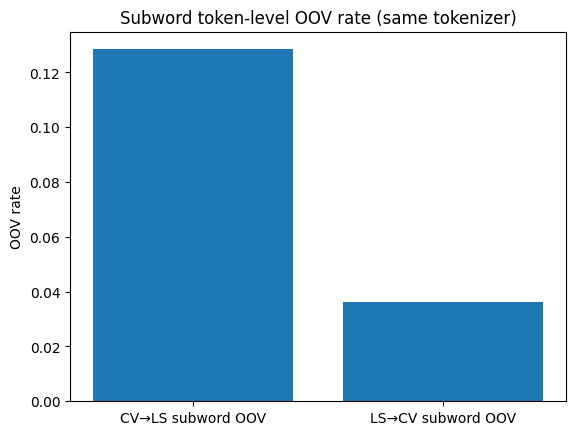

Top CV subword tokens not seen in LS (by frequency)


,token_id,count,decoded
0,1989,145,area
1,28899,124,chemist
2,5062,84,album
3,1074,81,team
4,2646,81,film
5,2291,80,include
6,705,67,'
7,2716,63,released
8,3058,63,currently
9,1912,57,based


Top LS subword tokens not seen in CV (by frequency)


,token_id,count,decoded
0,17903,37,thee
1,8631,19,plain
2,13318,15,altogether
3,20512,12,bool
4,22027,12,hath
5,44027,12,ustration
6,37196,12,splendid
7,11368,10,ears
8,32327,9,delightful
9,39306,9,slang


In [29]:
from transformers import AutoTokenizer
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Pick a tokenizer relevant to your pipeline:
# - Whisper uses a GPT2-like tokenizer
# - For general ASR/NLP token overlap, this is fine
TOKENIZER_NAME = "openai/whisper-small.en"   # or "openai/whisper-small" / "gpt2"

tok = AutoTokenizer.from_pretrained(TOKENIZER_NAME)
print("Tokenizer:", TOKENIZER_NAME, "| vocab size:", tok.vocab_size)

def token_counts_from_texts(texts, tokenizer, max_samples=None):
    """
    Returns:
      - token_freq: pd.Series mapping token_id -> count
      - total_tokens: total token count
    """
    counter = {}
    total = 0

    iterable = texts
    if max_samples is not None:
        iterable = list(texts)[:max_samples]

    for s in iterable:
        s = str(s)
        # tokenize to ids (no special tokens so we compare raw subwords)
        ids = tokenizer.encode(s, add_special_tokens=False)
        total += len(ids)
        for i in ids:
            counter[i] = counter.get(i, 0) + 1

    token_freq = pd.Series(counter).sort_values(ascending=False)
    return token_freq, total

# Use normalized texts from previous cells
cv_texts = df_cv_prep["text_norm"] if "text_norm" in df_cv_prep.columns else df_cv_prep["text"].apply(normalize_asr_text)
ls_texts = df_ls_devtest_prep["text_norm"] if "text_norm" in df_ls_devtest_prep.columns else df_ls_devtest_prep["text"].apply(normalize_asr_text)

# For speed, optionally cap samples (increase later)
MAX_SAMPLES = 20000
cv_token_freq, cv_total = token_counts_from_texts(cv_texts, tok, max_samples=MAX_SAMPLES)
ls_token_freq, ls_total = token_counts_from_texts(ls_texts, tok, max_samples=MAX_SAMPLES)

CV_TOKEN_SET = set(cv_token_freq.index.tolist())
LS_TOKEN_SET = set(ls_token_freq.index.tolist())

def token_oov_stats(source_token_freq: pd.Series, ref_token_set: set, source_total_tokens: int):
    # token-level OOV: frequency-weighted
    oov_ids = [tid for tid in source_token_freq.index if tid not in ref_token_set]
    oov_count = int(source_token_freq.loc[oov_ids].sum()) if len(oov_ids) else 0
    oov_rate = (oov_count / source_total_tokens) if source_total_tokens > 0 else np.nan

    # type-level OOV: unique token ids
    oov_type_rate = (len(oov_ids) / len(source_token_freq.index)) if len(source_token_freq.index) > 0 else np.nan
    return oov_rate, oov_type_rate, oov_ids, oov_count

cv_oov_rate, cv_oov_type_rate, cv_oov_ids, cv_oov_count = token_oov_stats(cv_token_freq, LS_TOKEN_SET, cv_total)
ls_oov_rate, ls_oov_type_rate, ls_oov_ids, ls_oov_count = token_oov_stats(ls_token_freq, CV_TOKEN_SET, ls_total)

print(f"Subword token-level OOV: CV wrt LS = {cv_oov_rate:.4f} (OOV tokens {cv_oov_count}/{cv_total})")
print(f"Subword token-level OOV: LS wrt CV = {ls_oov_rate:.4f} (OOV tokens {ls_oov_count}/{ls_total})")
print(f"Subword type-level OOV:  CV not in LS = {cv_oov_type_rate:.4f}")
print(f"Subword type-level OOV:  LS not in CV = {ls_oov_type_rate:.4f}")

plt.figure()
plt.bar(["CV→LS subword OOV", "LS→CV subword OOV"], [cv_oov_rate, ls_oov_rate])
plt.title("Subword token-level OOV rate (same tokenizer)")
plt.ylabel("OOV rate")
plt.show()

# Show most frequent OOV token strings (top 30)
def show_top_oov(token_freq: pd.Series, oov_ids: list, tokenizer, topn=30, title=""):
    if not oov_ids:
        print(title, "No OOV tokens found.")
        return
    top = token_freq.loc[oov_ids].sort_values(ascending=False).head(topn)
    decoded = [tokenizer.decode([int(tid)]) for tid in top.index]
    out = pd.DataFrame({"token_id": top.index.astype(int), "count": top.values, "decoded": decoded})
    print(title)
    display(out)

show_top_oov(cv_token_freq, cv_oov_ids, tok, topn=30, title="Top CV subword tokens not seen in LS (by frequency)")
show_top_oov(ls_token_freq, ls_oov_ids, tok, topn=30, title="Top LS subword tokens not seen in CV (by frequency)")

> Word OOV can be high because of spelling variants, names, rare words.

> Subword OOV is usually much lower because subword tokenization can represent new words by combining smaller pieces.

In [30]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import librosa
import soundfile as sf
from tqdm.auto import tqdm

def load_audio_mono(path, target_sr=16000):
    """
    Robust loader:
    - Try soundfile first (fast for wav/flac).
    - Fall back to librosa for mp3/others.
    Returns y (float32), sr (target_sr)
    """
    try:
        info = sf.info(path)
        # If soundfile can read it, use it
        y, sr = sf.read(path, dtype="float32", always_2d=False)
        if y.ndim == 2:  # stereo -> mono
            y = y.mean(axis=1)
        if sr != target_sr:
            y = librosa.resample(y, orig_sr=sr, target_sr=target_sr)
            sr = target_sr
        return y.astype(np.float32), sr
    except Exception:
        y, sr = librosa.load(path, sr=target_sr, mono=True)
        return y.astype(np.float32), sr

def compute_audio_metrics(path, sr=16000, frame_length=1024, hop_length=256,
                          silence_db_threshold=-35.0, clip_threshold=0.99):
    """
    Returns:
      duration_sec
      rms_db (dBFS-like proxy)
      clipping_rate (fraction of samples with abs >= clip_threshold)
      silence_ratio (fraction of frames with RMS below silence threshold)
    """
    y, sr = load_audio_mono(path, target_sr=sr)
    if len(y) == 0:
        return np.nan, np.nan, np.nan, np.nan

    duration = len(y) / sr

    # RMS loudness proxy
    rms = np.sqrt(np.mean(y**2) + 1e-12)
    rms_db = 20.0 * np.log10(rms + 1e-12)

    # Clipping rate
    clipping_rate = float(np.mean(np.abs(y) >= clip_threshold))

    # Frame RMS for silence ratio
    frame_rms = librosa.feature.rms(y=y, frame_length=frame_length, hop_length=hop_length)[0]
    frame_rms_db = 20.0 * np.log10(frame_rms + 1e-12)
    silence_ratio = float(np.mean(frame_rms_db < silence_db_threshold))

    return float(duration), float(rms_db), float(clipping_rate), float(silence_ratio)

CV audio metrics:   0%|          | 0/3000 [00:00<?, ?it/s]

,duration_sec,duration_sec_real,rms_db,clipping_rate,silence_ratio
count,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000
mean,5.091727,5.084377,-24.747871,0.000006,0.477599
std,1.634934,1.635129,6.379911,0.000176,0.167019
min,1.444125,1.440000,-57.133957,0.000000,0.039604
25%,3.893250,3.888000,-28.124217,0.000000,0.364540
50%,4.997625,4.992000,-24.070712,0.000000,0.456607
75%,6.220125,6.216000,-20.162547,0.000000,0.562962
max,14.788125,14.784000,-10.033360,0.008757,1.000000


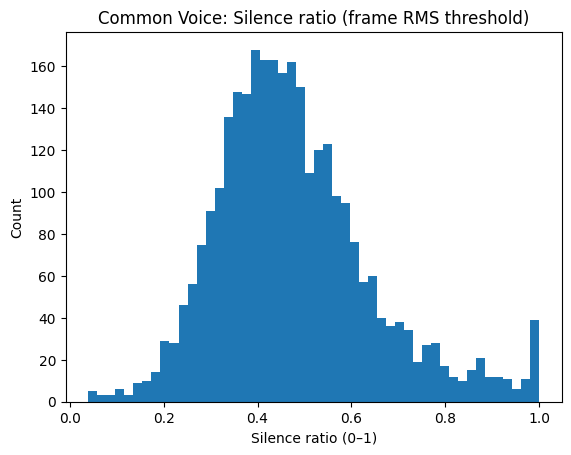

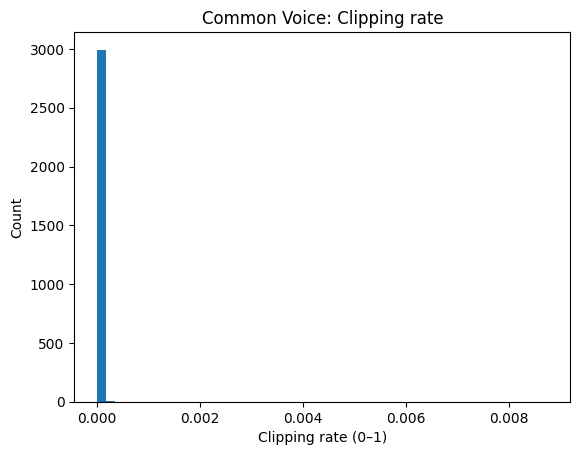

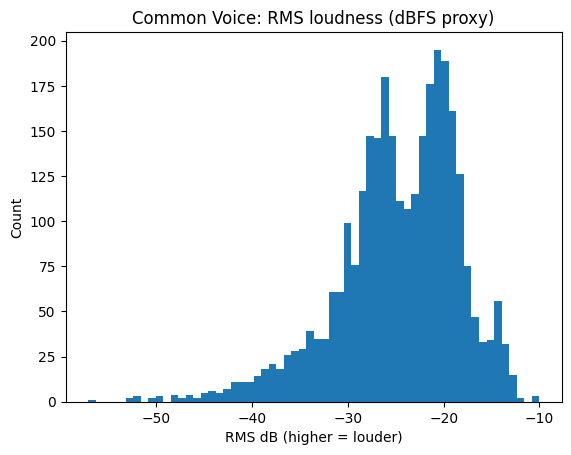

In [31]:
# Adjust sample size for speed
CV_AUDIO_SAMPLE_N = min(3000, len(df_cv_prep))  # increase later if you want

cv_sample = df_cv_prep.sample(CV_AUDIO_SAMPLE_N, random_state=42).copy()

rows = []
for p in tqdm(cv_sample["audio_path"].tolist(), desc="CV audio metrics"):
    dur, rms_db, clip_rate, sil_ratio = compute_audio_metrics(
        p,
        sr=16000,
        frame_length=1024,
        hop_length=256,
        silence_db_threshold=-35.0,  # tune if needed
        clip_threshold=0.99
    )
    rows.append((dur, rms_db, clip_rate, sil_ratio))

cv_metrics = pd.DataFrame(rows, columns=["duration_sec_real", "rms_db", "clipping_rate", "silence_ratio"])
cv_sample = pd.concat([cv_sample.reset_index(drop=True), cv_metrics], axis=1)

display(cv_sample[["duration_sec", "duration_sec_real", "rms_db", "clipping_rate", "silence_ratio"]].describe())

# Plots
plt.figure()
plt.hist(cv_sample["silence_ratio"].dropna(), bins=50)
plt.title("Common Voice: Silence ratio (frame RMS threshold)")
plt.xlabel("Silence ratio (0–1)")
plt.ylabel("Count")
plt.show()

plt.figure()
plt.hist(cv_sample["clipping_rate"].dropna(), bins=50)
plt.title("Common Voice: Clipping rate")
plt.xlabel("Clipping rate (0–1)")
plt.ylabel("Count")
plt.show()

plt.figure()
plt.hist(cv_sample["rms_db"].dropna(), bins=60)
plt.title("Common Voice: RMS loudness (dBFS proxy)")
plt.xlabel("RMS dB (higher = louder)")
plt.ylabel("Count")
plt.show()

LS audio metrics:   0%|          | 0/3000 [00:00<?, ?it/s]

,duration_sec,duration_sec_real,rms_db,clipping_rate,silence_ratio
count,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000
mean,6.235990,6.235990,-25.210536,0.000002,0.381535
std,3.254925,3.254925,3.599956,0.000042,0.131329
min,1.285000,1.285000,-45.518436,0.000000,0.000000
25%,3.533750,3.533750,-26.865668,0.000000,0.291904
50%,5.437500,5.437500,-24.734355,0.000000,0.362513
75%,8.305000,8.305000,-23.089309,0.000000,0.448276
max,15.000000,15.000000,-10.986584,0.001339,1.000000


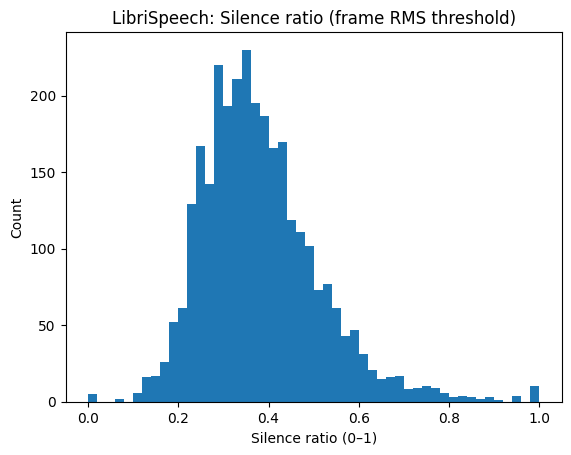

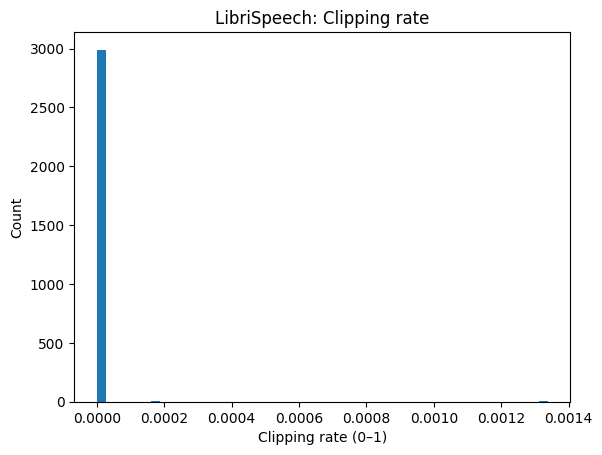

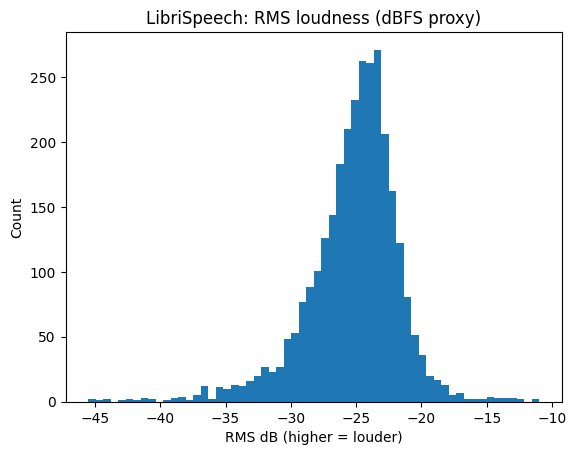

In [33]:
LS_AUDIO_SAMPLE_N = min(3000, len(df_ls_devtest_prep))  # increase later

ls_sample = df_ls_devtest_prep.sample(LS_AUDIO_SAMPLE_N, random_state=42).copy()

rows = []
for p in tqdm(ls_sample["audio_path"].tolist(), desc="LS audio metrics"):
    dur, rms_db, clip_rate, sil_ratio = compute_audio_metrics(
        p,
        sr=16000,
        frame_length=1024,
        hop_length=256,
        silence_db_threshold=-35.0,
        clip_threshold=0.99
    )
    rows.append((dur, rms_db, clip_rate, sil_ratio))

ls_metrics = pd.DataFrame(rows, columns=["duration_sec_real", "rms_db", "clipping_rate", "silence_ratio"])
ls_sample = pd.concat([ls_sample.reset_index(drop=True), ls_metrics], axis=1)

display(ls_sample[["duration_sec", "duration_sec_real", "rms_db", "clipping_rate", "silence_ratio"]].describe())

plt.figure()
plt.hist(ls_sample["silence_ratio"].dropna(), bins=50)
plt.title("LibriSpeech: Silence ratio (frame RMS threshold)")
plt.xlabel("Silence ratio (0–1)")
plt.ylabel("Count")
plt.show()

plt.figure()
plt.hist(ls_sample["clipping_rate"].dropna(), bins=50)
plt.title("LibriSpeech: Clipping rate")
plt.xlabel("Clipping rate (0–1)")
plt.ylabel("Count")
plt.show()

plt.figure()
plt.hist(ls_sample["rms_db"].dropna(), bins=60)
plt.title("LibriSpeech: RMS loudness (dBFS proxy)")
plt.xlabel("RMS dB (higher = louder)")
plt.ylabel("Count")
plt.show()

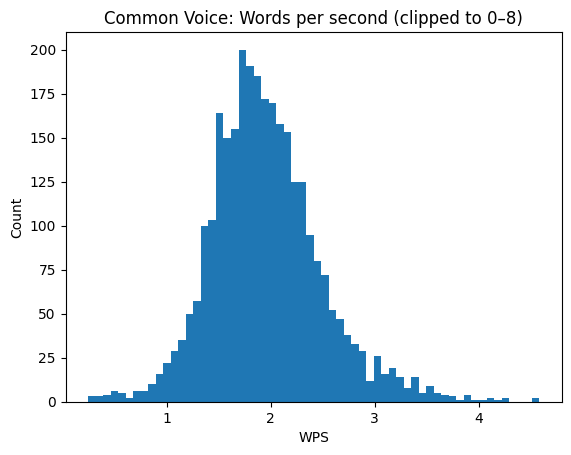

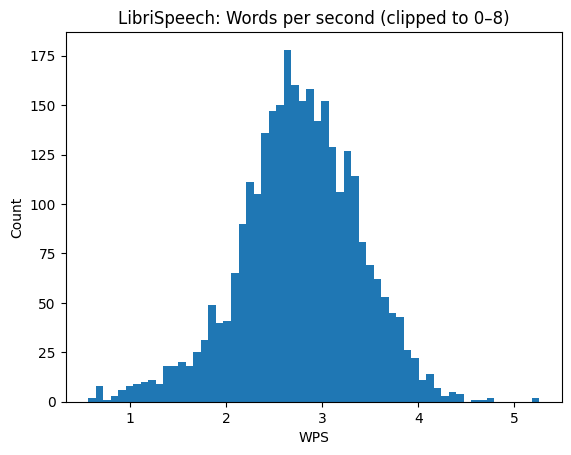

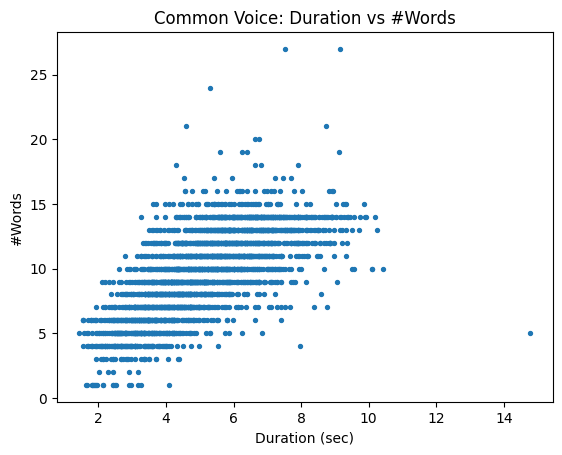

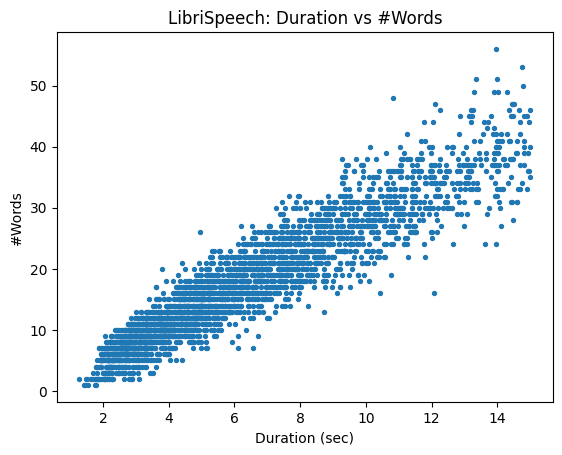

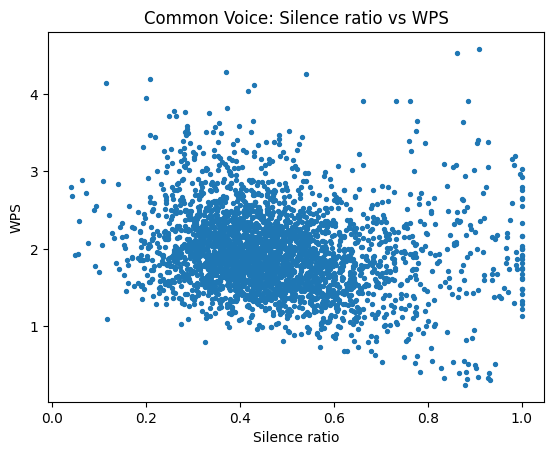

In [34]:
def add_wps(df, duration_col="duration_sec", text_col="text_norm"):
    df = df.copy()
    # safeguard: if duration_col missing, try real duration
    if duration_col not in df.columns and "duration_sec_real" in df.columns:
        duration_col = "duration_sec_real"

    df["n_words"] = df[text_col].astype(str).str.split().apply(len)
    df["duration_for_wps"] = df[duration_col].astype(float)
    df = df[df["duration_for_wps"] > 0].copy()
    df["wps"] = df["n_words"] / df["duration_for_wps"]
    return df

# Use sampled frames we already computed (cv_sample/ls_sample)
cv_wps = add_wps(cv_sample, duration_col="duration_sec_real", text_col="text_norm")
ls_wps = add_wps(ls_sample, duration_col="duration_sec_real", text_col="text_norm")

# WPS histograms
plt.figure()
plt.hist(cv_wps["wps"].clip(0, 8), bins=60)
plt.title("Common Voice: Words per second (clipped to 0–8)")
plt.xlabel("WPS")
plt.ylabel("Count")
plt.show()

plt.figure()
plt.hist(ls_wps["wps"].clip(0, 8), bins=60)
plt.title("LibriSpeech: Words per second (clipped to 0–8)")
plt.xlabel("WPS")
plt.ylabel("Count")
plt.show()

# Scatter: duration vs words (spot mismatches/outliers)
plt.figure()
plt.scatter(cv_wps["duration_for_wps"], cv_wps["n_words"], s=8)
plt.title("Common Voice: Duration vs #Words")
plt.xlabel("Duration (sec)")
plt.ylabel("#Words")
plt.show()

plt.figure()
plt.scatter(ls_wps["duration_for_wps"], ls_wps["n_words"], s=8)
plt.title("LibriSpeech: Duration vs #Words")
plt.xlabel("Duration (sec)")
plt.ylabel("#Words")
plt.show()

# Optional: scatter WPS vs silence_ratio (speech segments quality proxy)
if "silence_ratio" in cv_wps.columns:
    plt.figure()
    plt.scatter(cv_wps["silence_ratio"], cv_wps["wps"], s=8)
    plt.title("Common Voice: Silence ratio vs WPS")
    plt.xlabel("Silence ratio")
    plt.ylabel("WPS")
    plt.show()

In [36]:
from sklearn.model_selection import train_test_split

# Make sure df_cv (merged) still exists and contains client_id_x
assert "client_id_x" in df_cv.columns, "client_id_x not found in df_cv"

df_cv_split = df_cv[["audio_path", "text", "client_id_x"]].copy()

# First split: train vs temp
train_df, temp_df = train_test_split(
    df_cv_split,
    test_size=0.10,
    random_state=42,
    shuffle=True
)

# Split temp into val and test
val_df, test_df = train_test_split(
    temp_df,
    test_size=0.50,
    random_state=42,
    shuffle=True
)

print("Train size:", len(train_df))
print("Val size:", len(val_df))
print("Test size:", len(test_df))

Train size: 50105
Val size: 2784
Test size: 2784


In [37]:
def speaker_overlap_report(train_df, val_df, test_df, speaker_col):
    for name, d in [("train", train_df), ("val", val_df), ("test", test_df)]:
        if speaker_col not in d.columns:
            raise ValueError(f"'{speaker_col}' missing in {name} dataframe. Columns: {d.columns.tolist()}")

    tr = set(train_df[speaker_col].dropna().astype(str))
    va = set(val_df[speaker_col].dropna().astype(str))
    te = set(test_df[speaker_col].dropna().astype(str))

    tr_va = tr.intersection(va)
    tr_te = tr.intersection(te)
    va_te = va.intersection(te)

    print("Speaker overlap counts:")
    print("  train ∩ val :", len(tr_va))
    print("  train ∩ test:", len(tr_te))
    print("  val   ∩ test:", len(va_te))

    # Percent of val/test speakers that also appear in train
    if len(va) > 0:
        print(f"  % val speakers in train:  {100*len(tr_va)/len(va):.2f}%")
    if len(te) > 0:
        print(f"  % test speakers in train: {100*len(tr_te)/len(te):.2f}%")

    # If leakage exists, show examples
    if len(tr_va) > 0:
        print("\nExample overlapping speakers (train & val):", list(sorted(tr_va))[:10])
    if len(tr_te) > 0:
        print("Example overlapping speakers (train & test):", list(sorted(tr_te))[:10])

# ---- Run it (edit speaker_col as needed) ----
# For Common Voice your speaker id column was typically 'client_id_x'
# This requires that your train_df/val_df/test_df still carry that column.
speaker_col = "client_id_x"

# If you only kept ["audio_path","text"] earlier, remake split dfs including speaker_id before calling this.
speaker_overlap_report(train_df, val_df, test_df, speaker_col)

Speaker overlap counts:
  train ∩ val : 444
  train ∩ test: 428
  val   ∩ test: 317
  % val speakers in train:  100.00%
  % test speakers in train: 99.30%

Example overlapping speakers (train & val): ['008f1e5e50d2af1343f74a4f7a841bb49fe5083abd8cb36ed80f1da59223569b2b7b2945f3b885eb6a2d91d0704af7b2e891f0a6f8ffd6bec00832870bf6ca97', '00e2b3f397c42ff5d9504ddd850f557a943b10e7eab0c564671cbe275fd5c2649d0fd1b36f656aa5ada65a2bafc0195551593f97a1c52598622117daece8b6fa', '0212a6646cd3447d5018448f4a57100f8d786debf093972b9e67d1e91109f2523cabd93aea07a32629504e8a909267f9bc73c16917a0eeec176193d1be673cb4', '02ac69bf462d6346d89a63b1b391486e72c7352b6508ea664cbc4e41bf4e685fe589c70258ea9fbdfdfeb8897f4a122b61b720a7be603fd6da8ab89ed916358d', '02d621d25dbc49b32faac030a1d9771e88fe6e8063e67180b8ad60d3c2ae8dbd6db72493ff7e978a76cc96ec71f4fec67b7345e2ac854ac602fb485d7733e590', '02fe8565fe2e17aef06ce6173e5e0e33d30158e8dad71390ea42c3254f04b4511d4564259161a107d624f37ef2b7399ec79e2edc6ec2d7c62be8dadad7c936f3', '030daf

In [38]:
# Create speaker-disjoint split

speakers = df_cv_split["client_id_x"].dropna().unique()
np.random.seed(42)
np.random.shuffle(speakers)

n = len(speakers)
train_spk = speakers[:int(0.8*n)]
val_spk   = speakers[int(0.8*n):int(0.9*n)]
test_spk  = speakers[int(0.9*n):]

train_df = df_cv_split[df_cv_split["client_id_x"].isin(train_spk)].copy()
val_df   = df_cv_split[df_cv_split["client_id_x"].isin(val_spk)].copy()
test_df  = df_cv_split[df_cv_split["client_id_x"].isin(test_spk)].copy()

print("Train speakers:", len(train_spk))
print("Val speakers:", len(val_spk))
print("Test speakers:", len(test_spk))

Train speakers: 673
Val speakers: 84
Test speakers: 85


In [39]:
speaker_overlap_report(train_df, val_df, test_df, "client_id_x")

Speaker overlap counts:
  train ∩ val : 0
  train ∩ test: 0
  val   ∩ test: 0
  % val speakers in train:  0.00%
  % test speakers in train: 0.00%
